# Import Python packages

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor

from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

import torch
from torch.utils.data import TensorDataset, DataLoader
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch import nn
from torch.nn import  functional as F

In [2]:
from sklearn.neural_network import MLPRegressor

# Make dataset

In [4]:
pd_train = pd.read_excel("D:/database/data_all_strain-controlled.xls",nrows=100000)#Change this path to your own path 
pd_train.head()

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Unnamed: 5,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304,NaN,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304,NaN,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304,NaN,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304,NaN,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304,NaN,3.409764


In [5]:
pd_train.drop(columns=['Unnamed: 5'],inplace=True)
pd_train

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304000,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304000,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304000,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304000,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304000,3.409764
...,...,...,...,...,...,...
909,AZ31B-4-0.004-0.0069.csv,44.8,298.0,244.0,0.325444,3.281033
910,AZ31B-4-0.005-0.0087.csv,44.8,298.0,244.0,0.325444,2.763428
911,AZ31B-4-0.0075-0.013.csv,44.8,298.0,244.0,0.325444,2.255273
912,AZ31B-4-0.0100-0.0173.csv,44.8,298.0,244.0,0.325444,1.832509


In [6]:
pd_train.shape

(914, 6)

In [7]:
pd_train['Nf(label)'].value_counts()

Nf(label)
2.838849    4
3.429914    3
2.763428    3
3.152288    3
2.602060    3
           ..
2.819544    1
2.444045    1
2.822168    1
2.735599    1
1.544068    1
Name: count, Length: 872, dtype: int64

In [8]:
pd_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 914 entries, 0 to 913
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   load       914 non-null    object 
 1   E(Gpa)     914 non-null    float64
 2   TS(Mpa)    914 non-null    float64
 3   ss（Mpa）    914 non-null    float64
 4   m          914 non-null    float64
 5   Nf(label)  914 non-null    float64
dtypes: float64(5), object(1)
memory usage: 43.0+ KB


# Read csv files

In [9]:
csv_path = 'D:/database/All data_Strain/'#Change this path to your own path

In [10]:
csv_files = pd_train['load'].values
csv_files[:5]

array(['q235b-0.002.csv', 'q235b-0.003.csv', 'q235b-0.004.csv',
       'q235b-0.005.csv', 'q235b-0.006.csv'], dtype=object)

In [11]:
one_df = pd.read_csv(csv_path+csv_files[10],header=None)
one_df.head()


,0,1
0,0.0,0.000000
1,0.0,0.000144
2,0.0,0.000289
3,0.0,0.000433
4,0.0,0.000577


In [12]:
pd.read_csv(csv_path+'E355-20-14-0.0036-0.0061.csv',header=None).iloc[:,:2]

,0,1
0,0.000000,0.000000
1,0.000932,0.001112
2,0.001800,0.002186
3,0.002546,0.003187
4,0.003118,0.004082
...,...,...
236,-0.003118,-0.004082
237,-0.002546,-0.003187
238,-0.001800,-0.002186
239,-0.000932,-0.001112


In [13]:
value_list = []
for i in range(len(csv_files)):
    try:
      # print(csv_files[i])
      one_df = pd.read_csv(csv_path+csv_files[i],header=None).iloc[:,:2]
      value_list.append(one_df.values)
      print(one_df.shape)
    except:
      print(csv_path+csv_files[i] , 'no here ')

(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(

# Merge into a large array

In [14]:
csv_value_array = np.array(value_list)
csv_value_array.shape

(914, 241, 2)

In [15]:
flatten_value_list = [item.flatten() for item in  value_list]
flatten_value_list[0].shape

(482,)

<Axes: >

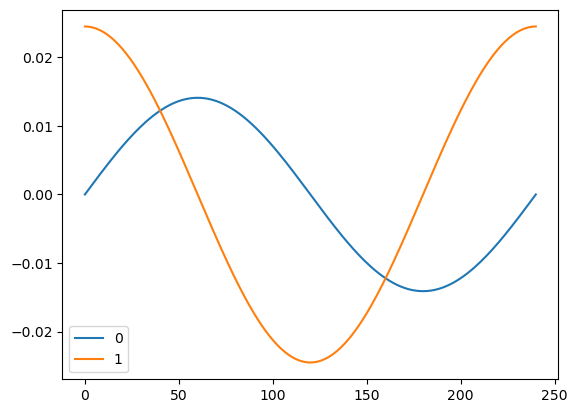

In [16]:
one_df.plot()

# Data processing pipline

In [17]:
pd_train.head()

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304,3.409764


In [18]:
# Filter out columns of non object type
num_cols = pd_train.select_dtypes(exclude=['object']).columns.tolist()[:-1]

print("Non-object columns:", num_cols)

Non-object columns: ['E(Gpa)', 'TS(Mpa)', 'ss（Mpa）', 'm']


In [19]:
num_si_step = ('si', SimpleImputer(strategy='median'))
num_ss_step = ('ss', StandardScaler()) #Normalization of mean standard deviation
num_steps = [num_si_step, num_ss_step]

num_pipe = Pipeline(num_steps)
num_transformers = [('num', num_pipe, num_cols)]

ct = ColumnTransformer(transformers=num_transformers)

x_all = ct.fit_transform(pd_train)
x_all.shape

(914, 4)

In [20]:
x_all[:5]

array([[ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619]])

In [21]:
y_all = pd_train['Nf(label)'].values
y_all.shape,y_all[:10]

((914,),
 array([4.42758347, 4.07125588, 3.81211084, 3.57310378, 3.4097641 ,
        3.0374265 , 4.61187194, 4.30209272, 3.98421217, 3.88109922]))

In [22]:
dim_num = x_all.shape[-1]
dim_num

4

# Divide the dataset and test set

In [23]:
from sklearn.model_selection import train_test_split

# x_all_new, csv_value_array, y_all are 3 NumPy arrays
x_train, x_test, csv_value_train, csv_value_test, y_train, y_test,csv_files_train, csv_files_test = train_test_split(x_all, csv_value_array, y_all,csv_files, test_size=0.2, random_state=42)
# The dataset was randomly divided into training and testing sets with a ratio of 8:2, which may lead to slight variations in the results for each model.
print("The size of the training set：", x_train.shape[0])
print("The size of the test set：", x_test.shape[0])
x_train.shape, x_test.shape, csv_value_train.shape, csv_value_test.shape, y_train.shape, y_test.shape

The size of the training set： 731
The size of the test set： 183


((731, 4), (183, 4), (731, 241, 2), (183, 241, 2), (731,), (183,))

# Pytorch dataset dataloader
   
  Prepare Dataset

In [24]:
x_train, x_test, csv_value_train, csv_value_test, y_train, y_test

(array([[-1.40434922, -0.91169623, -0.35126438, -0.20713854],
        [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
        [ 0.67425312, -0.63873605, -0.48032664, -0.20713854],
        ...,
        [-1.82365911, -1.04108102, -0.73570516,  0.29174678],
        [ 0.87982918,  3.82676089,  3.69451712, -0.20713854],
        [ 0.67425312, -0.63873605, -0.48032664, -0.20713854]]),
 array([[ 0.8716714 ,  0.47814685,  0.67391102, -0.20713854],
        [-1.82365911, -1.04108102, -0.73570516,  0.29174678],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.6677269 ,  2.3980502 ,  2.73799185, -0.87655194],
        [-1.42066478, -0.78648514, -0.8409687 ,  0.53665412],
        [-0.37646894, -0.67796886, -0.98284566,  0.53665412],
        [-1.41577011, -1.24934879, -0.7379935 ,  1.0325159 ],
        [ 0.8308825 , -0.48597853, -0.53890809, -0.1079

In [25]:
from torch.utils.data import TensorDataset

train_ds = TensorDataset(torch.tensor(x_train).float(),torch.tensor(csv_value_train).float(), torch.tensor(y_train).float().unsqueeze(1))
test_ds = TensorDataset(torch.tensor(x_test).float(),torch.tensor(csv_value_test).float(), torch.tensor(y_test).float().unsqueeze(1))

In [26]:
len(train_ds), len(test_ds)

(731, 183)

# Prepare dataloader

In [27]:
batch_size = 31
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [28]:
train_dl

# Check shape of the input data

In [29]:
for b_x, b_x_csv,b_y in test_dl:
  print(b_x.shape)
  print(b_x_csv.shape)
  print(b_y.shape)
  break

torch.Size([31, 4])
torch.Size([31, 241, 2])
torch.Size([31, 1])


In [30]:
b_y

tensor([[3.8176],
        [4.4358],
        [5.6955],
        [2.8451],
        [5.9240],
        [3.6521],
        [4.6064],
        [3.3818],
        [4.3040],
        [3.1956],
        [4.4381],
        [2.3711],
        [3.0817],
        [3.8833],
        [2.8331],
        [3.8063],
        [3.4143],
        [4.2310],
        [4.9761],
        [3.5997],
        [3.2810],
        [4.4846],
        [3.9415],
        [4.1056],
        [3.9089],
        [3.1024],
        [3.5700],
        [3.7679],
        [2.6021],
        [1.9731],
        [2.6294]])

# Prepare for training

In [31]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    for batch, (X,x_csv, y) in enumerate(dataloader):
        X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

        # Compute prediction error
        pred = model(X,x_csv)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch % 5 == 0:
            loss, current = loss.item(), (batch + 1) * len(X)
            print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

def test(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for (X,x_csv, y) in dataloader:
            X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

            pred = model(X,x_csv)
            test_loss += loss_fn(pred, y).item()
    test_loss /= num_batches
    print(f"Avg loss: {test_loss:>8f} \n")
    return test_loss

In [32]:
# Get cpu or gpu device for training.
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


# Build model
  structural data part

In [33]:
class DNNModel(nn.Module):
    def __init__(self,):
        super().__init__()
        self.nor = nn.BatchNorm1d(dim_num)
        self.lin1 = nn.Linear(dim_num,200)
        self.lin2 = nn.Linear(200,100)
        self.lin3 = nn.Linear(100,100)
        #self.out = nn.Linear(10, 1)
        self.flatten = nn.Flatten()

    def forward(self, x):

        x= F.relu(self.lin1(x))
        x= F.relu(self.lin2(x))
        x= F.relu(self.lin3(x))
        # x = self.out(x)

        return x
dnn_block = DNNModel().to(device)

dnn_block(b_x.to(device)).shape

torch.Size([31, 100])

CNN part

In [34]:
class CNNModel(nn.Module):
    def __init__(self,):
        super().__init__()
        self.nor = nn.BatchNorm1d(dim_num)
        self.cnn1 = nn.Conv1d(241, 50, 1)
        self.flatten = nn.Flatten()
        self.lin1 = nn.Linear(100,100)
        # self.lin2 = nn.Linear(10,1)


    def forward(self, x):
        # x = self.flatten(x)
        x= F.relu(self.cnn1(x))
        x = self.flatten(x)
        x= self.lin1(x)

        return x
cnn_block = CNNModel().to(device)

cnn_block(b_x_csv.to(device)).shape

torch.Size([31, 100])

Merge models

In [35]:
class bigModel(nn.Module):
    def __init__(self, ):
        super().__init__()
        self.strct_block = dnn_block
        #self.lstm_block = lstm_block
        #self.f_block = f_block
        self.cnn_block = cnn_block

        self.flatten = nn.Flatten()
        self.att = nn.TransformerEncoderLayer(100,2)

        self.lin1 = nn.Linear(200, 100)
        self.lin2 = nn.Linear(100, 100)
        self.out = nn.Linear(100, 1)
    def forward(self, b_x, b_x_csv):
        x_strct = self.strct_block(b_x)
        #x_lstm = self.lstm_block(b_x_csv)
        #x_f = self.f_block(b_x_csv)
        x_cnn = self.cnn_block(b_x_csv)
        x = torch.stack((x_strct, x_cnn), dim=1)
        print(x.shape)
        #x = self.att(x)
        x = self.flatten(x)
        print(x.shape)
        x = F.relu(self.lin1(x))
        #x = torch.cat((x, x_f), dim=1)
        #print(x.shape)
        x = F.relu(self.lin2(x))
        x = self.out(x)
        return x

big_model = bigModel().to(device)
big_model(b_x.to(device), b_x_csv.to(device)).shape

torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 1])

Loss function and optimizer

In [36]:
loss_fn = nn.MSELoss()
optimizer = torch.optim.AdamW(big_model.parameters(), lr=1e-3)

Training and testing

In [37]:
# Initialize Best Test Loss
best_test_loss = float('inf')

epochs = 3000
train_loss_list = []
test_loss_list = []

for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train(train_dl, big_model, loss_fn, optimizer)
    train_loss = test(train_dl, big_model, loss_fn)
    test_loss = test(test_dl, big_model, loss_fn)

    train_loss_list.append(train_loss)
    test_loss_list.append(test_loss)

    # Save Best Model Weights
    if test_loss < best_test_loss:
        best_test_loss = test_loss
        torch.save(big_model.state_dict(), 'best_model_weights_CNN.pth')
        print(f"Best model saved! loss is {best_test_loss}")

print("Done!")

# Load Best Model Weights
best_model = big_model
best_model.load_state_dict(torch.load('best_model_weights_CNN.pth'))
best_model.eval()  # Set the model to evaluation mode and disable the impact of Dropout and Batch Normalization


Epoch 1
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 14.665693  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 11.326365  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 12.062319  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 6.075446  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.720714  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.592516  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.634964  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.365189  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.338835  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.341625  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.729280  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.303177  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.590786  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.467400  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.330576 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.339488 

Best model saved! loss is 0.33948786556720734
Epoch 18
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.291748  [   31/  

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.305743  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.214404  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.142911  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.129469  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.252892  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.201844  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.181031 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.172875 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.363213  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.138822  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.093309  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.155222  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.268136  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.155104  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.096897  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.080844  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.115816  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.199047  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.064520  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.068246  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.123728  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.138646  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.112442  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.088613  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.095325  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.096467  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.104297 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.169307 

Epoch 59
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.049676  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.051929  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size(

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.062484  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.089031  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.181898  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.154369  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.105847  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.036189  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.060347  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.099198  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.079636  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.096778  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.059431  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.045400  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.263155  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.069437  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.061278  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.062665  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.147128 

Epoch 91
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.100627  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.074325  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.066905  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
to

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.074219 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.138095 

Best model saved! loss is 0.13809513797362646
Epoch 94
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.078891  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.091812  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.068877 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.134891 

Best model saved! loss is 0.13489136658608913
Epoch 98
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.047848  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.080695  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.095834 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.054859  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.075101  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.084057  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.071313  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.038716  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.055095  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.069335 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.123459 

Epoch 113
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.043149  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.059272  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.102933  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.040512  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.120056  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.036802  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.123671  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.115673  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.105599  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.114822  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.058534  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.082064  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.073978 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.132323 

Epoch 136
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.045713  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

loss: 0.057192  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.073569  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.044208  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.044383  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.039324  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.082882  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.134908  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.060226  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.051073  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.158542  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.053576  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.081638  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.053046  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.082290  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.107952  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.080987  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.054475 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.111705 

Best model saved! loss is 0.11170507036149502
Epoch 157
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.055061  [   31/ 

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.054076  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.058368  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.062600  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.048894  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.049319  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.056885  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.043692  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.062296  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.049512  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.035250  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.067975  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.122740 

Epoch 181
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.062522  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.063560  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.054496  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.049121 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.113186 

Epoch 185
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.065054  [   31/

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.152599  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.064455  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.059104  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052152  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.054649  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.072092  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.048200  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.083797  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.042773  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.092393  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.062214  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.044099  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.050643  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.065338  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.060949  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052767  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052409  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

loss: 0.054050  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033537  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030049  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.055861  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.046098 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.113278 

Epoch 219
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.060180  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052003  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.080647  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.070233  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.097646  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029603  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029456  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.048627  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.047465  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.045693  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.078784  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.047040  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.035458  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.075626  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.050310 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.118477 

Epoch 246
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022318  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.060096  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019261  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.045933  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.042890  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.065170  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.046731  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.034254  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.037700  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.050955  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.272016  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029435  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.037101  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030778  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.037448 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.112980 

Epoch 270
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015445  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027522  [  186/  731]
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.040102  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.042161  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.081521  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.049430  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.038166  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028755  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.044598  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033170  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033031  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.036352  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.025966  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052299  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.036218  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.031258  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.072468  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.025202  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.045768  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.038151  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.096020  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.031190 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.124106 

Epoch 302
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052218  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.035161 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.129946 

Epoch 305
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022968  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.034474 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.125495 

Epoch 308
-------------------------------
torch.Size([31, 2, 100]

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.036894 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.133267 

Epoch 311
-------------------------------
torch.Size([31, 2, 100]

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.027562 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029393  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.034468  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033794  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024123  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.034492  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052414  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033133  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.023995  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022683  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024349  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013901  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.026988 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.122965 

Epoch 336
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.042544  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.047530  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.031066 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.056527  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016837  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032339  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.123777 

Epoch 351
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.025776  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024232  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010827  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.125612 

Epoch 354
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012996  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013560  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017311  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.026146 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.133155 

Epoch 358
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.045387  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.039552  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.027107 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.125103 

Epoch 362
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021595  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027459  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.034034  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.015486  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018242  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017915  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026755  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019248  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027017  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024539  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023679  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.025321  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028144  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024859  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

Avg loss: 0.027125 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.134072 

Epoch 388
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030549  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020700  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.035676  [  341/  731]
torch.Size([31, 2, 100])
to

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.039168  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032497  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020659  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015200  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027503  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020052  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011612  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.050782  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032812  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016053  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030001  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016618  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021299  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032397  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014794  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.031298  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015997  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.137570 

Epoch 416
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024552  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016070  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012481  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022769  [  496/  731]
torch.Size([31, 2,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.019047 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.137959 

Epoch 420
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014432  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016210  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.022664 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033649  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023459  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019103  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022778  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.018530 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.050311  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.034054  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026682  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023243  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021416  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027915  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020549  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019108  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012217  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017155  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029928  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011606  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028084  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018967  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052896  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.025963  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016079  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033153  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022360  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.032595 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.148558 

Epoch 459
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023634  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015716  [  186/  731]
torch.Size

loss: 0.015142  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020605  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022261  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.038499  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024617  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.018708 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.140220 

Epoch 470
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029639  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022172  [  186/  731]
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.018757 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011825  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022757  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.025640  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012690  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.026041 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.161334 

Epoch 481
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012956  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021460  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022092  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017093  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.056608  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022135  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021706  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019206  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024331  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024616  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.015091 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.137002 

Epoch 515
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010732  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.043131  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.017711 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139577 

Epoch 519
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009672  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020146  [  186/  731]
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027930  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016696  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.038523  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009239  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016615  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013227  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015883  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014949  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017303  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013945  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011219  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030468  [

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018663  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014136  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.017389 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027428  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032700  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019240  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011765  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011869  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024465  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.024598 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.161055 

Epoch 572
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.040638  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020397  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.017070 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.144104 

Epoch 576
-------------------------------
torch.Size([31, 2, 100]

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011686  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012764  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014889  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032354  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011025  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.146938 

Epoch 587
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010623  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014319  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008156  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.012795 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.145649 

Epoch 591
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012547  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016549  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006199  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017389  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013697  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013330  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011243  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.014081 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.152902 

Epoch 606
--------

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020806  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010224  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013586  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014884  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008919  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010898  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017597  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019333  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

loss: 0.009524  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017728  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011531  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021681  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024894  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011736  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019691  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017219  [

loss: 0.014301  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008233  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018376  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022032  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027047  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011503  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023005  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010273  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.014934 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.149052 

Epoch 630
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011583  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019106  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016792  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.035997  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017737  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020270  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019401  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.019894 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.163454 

Epoch 648
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015212  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020288  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015874  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.037780  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020160  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018835  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024753  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.010817  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007799  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007547  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.039330  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.011184 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006745  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015918  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008476  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.152413 

Epoch 676
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008980  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008522  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011889  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033387  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022432  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014522  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010663  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.007583  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014070  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024585  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004727  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.026905 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.171381 

Epoch 694
--------

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023490  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016873  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013638  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030609  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018127  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021122  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015484  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029893  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011740  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011251  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013292  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019780  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.031103 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.156289 

Epoch 716
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026793  [   31/

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022426  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014899  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.034368  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015306  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028229  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013752  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020337  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.006913  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008934  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011210  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028230  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004836  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010004  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007971  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.013409 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.155344 

Epoch 737
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015914  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011935  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004936  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026909  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008095  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026074  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.015764  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014983  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010633  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003832  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018951  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.008854  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009135  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007769  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008923  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 200])
loss: 0.007894  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016727  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006925  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.035734  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.017472 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.169497 

Epoch 762
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012652  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006304  [  186/  731]
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016907  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008836  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015891  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010982  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026311  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015731  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005529  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008467  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012428  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020345  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018004  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013454  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011093  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.011942 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.147300 

Epoch 792
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028577  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014574  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007121  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012210  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015494  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014692  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010671  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.161805 

Epoch 811
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004840  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007848  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007364  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.011501 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.169200 

Epoch 815
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013271  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010991  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005582  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.020710  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010223  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006941  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009081  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.160178 

Epoch 826
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021345  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021089  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005174  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.012593 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021899  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027353  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010724  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012019  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027436  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011534  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011506  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.012493 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.154189 

Epoch 845
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013062  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004759  [  186/  731]
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.009032  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021895  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005119  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018646  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.154819 

Epoch 856
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011088  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004770  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023180  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

loss: 0.012584  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008366  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018066  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010413  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019943  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007998  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020437  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010722  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.006156  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015664  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008547  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005413  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

loss: 0.019913  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007597  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011264  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006401  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009469 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.152941 

Epoch 878
--------

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008958  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006191  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016353  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008029  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009334  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008520  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012511  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014145  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006580  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009944  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006244  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012694  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015968  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007113  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019092  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014044  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007632  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018907  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010192  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008773 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.149332 

Epoch 910
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003959  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011268  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010498  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020519  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014062  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027008  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009709  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006571  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003967  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002880  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005654  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.155532 

Epoch 924
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005799  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004304  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018930  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006801 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007164  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016588  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.007435  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007407  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014622  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009757  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015655  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018049  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011246  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006909  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008770  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004916  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023623  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014710  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012979  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009483 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005235  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006490  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006885  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.008627  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006196  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007236  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009275  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005739 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.147396 

Epoch 981
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003855  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003211  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015469  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009762  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.013003  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007173  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005373  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008632  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006877  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013134  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009999  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009691  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006932  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014113  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032433  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.148520 

Epoch 1002
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009954  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015065  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005296  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.006366  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004823  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.147616 

Epoch 1013
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003421  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003865  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003570  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021111  [  496/  731]
torch.Size([31, 2

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005835 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.148886 

Epoch 1017
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001660  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007461  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.146884 

Epoch 1020
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012141  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009074  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003770  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007671 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.152364 

Epoch 1024
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007910  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008742  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007715 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.146632 

Epoch 1031
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004946  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.148316 

Epoch 1038
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015193  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010106  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007005  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004547  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002713  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005730  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005704  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006290  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005905  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010456  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011606  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014793  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015993  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015850  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003185  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005243  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.006923  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006877  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008433  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005469  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011699  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015931  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016583  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021781  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011984  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012376  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007010  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019518  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016356  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005260  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006013  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008023  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006964  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005816  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004860  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008207 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006961  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005649  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010997  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009291  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014319  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008350  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.016965  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006553  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004080  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010711  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018105  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007663  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012606  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007320  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008271  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007130  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016891  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007270  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012271  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021769  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010560  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007361 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.146453 

Epoch 1125
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017639  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011123  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009564 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.148081 

Epoch 1129
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006182  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007454 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.142540 

Epoch 1133
-------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.007433  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.009254  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009832  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.004101  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003586  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006198  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009326 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.152571 

Epoch 1154
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013851  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005261  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009616 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139393 

Epoch 1158
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009921  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.006487  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005809  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011780  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006091  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.138093 

Epoch 1176
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010411  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005040  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013194  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139718 

Epoch 1180
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007568  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006360  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005125  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.140110 

Epoch 1183
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005473  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005047  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003160  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008341 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.142515 

Epoch 1187
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003699  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013370  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008588 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010523  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007369  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005833  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009106  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004236  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008220 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.145348 

Epoch 1202
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004292  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005703  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.017007  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005651  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008342  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005546  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006119  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007795  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003975  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006664 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.141556 

Epoch 1224
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016067  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012047  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006272  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004185  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002436  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006929  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005204  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014525  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015068  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.009112  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006634  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004849  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011910  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006078  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006623  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015378  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003594  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004003  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008302  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003953  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008469  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017886  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006280  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006341  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009834  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002338  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005022  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002446  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003276  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008172  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009058  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005344  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015872  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.003891  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005814  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006916  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011530  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010972  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009496  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006754 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.005384  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009308  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002863  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003709  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016135  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007819  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016470  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007634  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005365  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003703  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014591  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006263 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015214  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005937  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012261  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006705  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005523 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.138828 

Epoch 1317
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008824  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006263  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004369  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003415  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015142  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013484  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017676  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002720  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003289  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004869  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005149 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139098 

Epoch 1336
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003235  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005008  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007474  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006027  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007734  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008931  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004328  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008826  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003385  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008087  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013931  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002154  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005344  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006755 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.149975 

Epoch 1362
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007803  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006693 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007381  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004760  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004098  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004287  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006004  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004560 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.135839 

Epoch 1384
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007460  [   31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011263  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004952  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006408  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.003200  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010119  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008551  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005237 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139127 

Epoch 1410
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009540  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004441 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.143157 

Epoch 1413
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014770  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004160 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004338  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005977  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018355  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004722  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.140048 

Epoch 1435
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006548  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005048  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006137  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005790 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.142573 

Epoch 1439
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006078  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005652  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.143214 

Epoch 1442
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008048  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003066  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010615  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014281  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005275 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.142522 

Epoch 1446
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004077  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002805  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.013417  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004620  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014184  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.132471 

Epoch 1461
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004056  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003912  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001735  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003973 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.135620 

Epoch 1464
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003085  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002168  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005517 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.136401 

Epoch 1468
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012779  [   31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

loss: 0.007439  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006889  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.007176  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015406  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139513 

Epoch 1487
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004242  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004727  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004949  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005428  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005530 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.144672 

Epoch 1491
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004018  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013482  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003939 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.140897 

Epoch 1494
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004104  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006726  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004064 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.144380 

Epoch 1498
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004143  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004924 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017275  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001936  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004795  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004599 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.144597 

Epoch 1513
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002146  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010841  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.002219  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.004956  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004291  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004145  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003655  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139525 

Epoch 1538
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004796  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004769  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003857  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.137191 

Epoch 1541
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006015  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004587  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010593  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004796 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.142719 

Epoch 1545
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002510  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004421  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004895 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.143937 

Epoch 1549
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002258  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018397  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003350  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002755  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004569  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013227  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004253  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007158  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006841  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003649  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003658  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001981  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005017  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011559  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006365 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.146330 

Epoch 1577
-------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003740  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008994  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004523 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.143441 

Epoch 1584
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012852  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003677  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003012  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002617  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004006  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003042  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008405  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002537  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006287 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139206 

Epoch 1598
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005184  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004309  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003271  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004130  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004208  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002496  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003438  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004837  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006945  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004134  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004409  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003079  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

loss: 0.003822  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012153  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004527  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002742  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002686  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004243  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017854  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009937  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004371 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139083 

Epoch 1619
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002613  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003902  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005519  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003764  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005422  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.027489  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002461  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002922  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008268  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

loss: 0.005198  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008817  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004680  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005232  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004474 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.145758 

Epoch 1640
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003345  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008478  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006252  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006264  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013794  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009572 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.141708 

Epoch 1651
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006137  [   31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004185  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003892  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004329  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002766  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007086 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139220 

Epoch 1662
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005529  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009083  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005254  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.005293  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002055  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004552  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002842  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006044 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.140355 

Epoch 1677
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004104  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004855 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.034723  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004432  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006851  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007516  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002870  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008004  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002977  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003321  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004883  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002397  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005169  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004203 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.142801 

Epoch 1699
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004746  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005696  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.004369  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002517  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003351  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.002737  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002566  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005014  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003563  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.145944 

Epoch 1714
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001773  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003379  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002372  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001349  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004288 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139845 

Epoch 1718
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002723  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010544  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002695  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010075  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002595  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012835  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006499  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002765  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003651  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001948  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004504  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004714  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006905  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006540  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004669  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005599 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.136910 

Epoch 1740
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004749  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004710  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007012  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001725  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005584  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004345  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003785  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004048  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004538 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.142495 

Epoch 1759
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004117  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003566  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006576 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139365 

Epoch 1763
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007508  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006800  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008970  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005793  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005330  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005742  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.010443 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.145181 

Epoch 1778
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012474  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006364  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007075  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011013  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005409  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005894  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006714  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003843  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005098  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001423  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004711  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.143039 

Epoch 1803
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004475  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003255  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009197  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002768  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004307  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010211  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001957  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008456  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007977  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

loss: 0.008436  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004492  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.040967  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003885  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005191 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139299 

Epoch 1818
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005418  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005399  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002854  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001647  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004526  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004645  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.005011  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013586  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003213  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003408  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006161 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.134313 

Epoch 1837
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011224  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001868  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006123 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.138504 

Epoch 1841
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003374  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007174  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004127  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005789  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004978  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004151  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003203  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007677  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003530 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.134849 

Epoch 1862
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002405  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003945  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004639 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009315  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001779  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002662  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010306  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004666  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005598  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005972 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.133833 

Epoch 1883
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003326  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005806  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006170 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.005940  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009720  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004158  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005683  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004728  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003847  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006093  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006189 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.138323 

Epoch 1905
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008892  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003305 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007456  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.007993  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005490  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009014  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009847  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.003404  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007520  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003197  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005517  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.124081 

Epoch 1931
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002796  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005679  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010737  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003839 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.123576 

Epoch 1935
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002421  [   31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003571 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008384  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007274  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004646  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003467  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003019  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004936  [

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003887 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.130564 

Epoch 1957
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004738  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005270  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004375 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.126509 

Epoch 1961
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002020  [   31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004401  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.010627  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003120  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.128902 

Epoch 1975
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001830  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005801  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012287  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003985  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005164 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.132098 

Epoch 1979
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003098  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003450  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004339 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.131225 

Epoch 1983
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002380  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008215  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002315  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004855  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001750  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002361  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002667  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006438  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

loss: 0.003046  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001685  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015632  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001137  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003046  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005118  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007445  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002473  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027049  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009865  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013931  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020884  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006625 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.126831 

Epoch 2015
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007019  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004438  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003403 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.122842 

Epoch 2019
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003607  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005255 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003165 

torch.Size([31, 2, 100])
torch.Size([31

loss: 0.010091  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003168  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003259  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007820  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004675  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003174  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.007274  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005171  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002613  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003756  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004994 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003579  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.006100  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010500  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006666  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001871  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007000  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004255  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004267 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.114548 

Epoch 2054
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010403  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006630  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007516 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003466  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.002601  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004457  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001435  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002752  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008545  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002798  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010094  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004913  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002083  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003168  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004502  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006101  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015103  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002154  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004838  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004090  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016127  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.008144  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003522  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004951  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004483  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004442  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005810  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004922 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.120695 

Epoch 2104
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004240  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009213  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007258  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004269  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003242  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001526  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002026  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006724  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003766  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004076  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.121342 

Epoch 2123
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004307  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002545  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003859  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003019 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001771  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009507  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006201  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017711  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002476  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001774  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005140  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001253  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.117903 

Epoch 2146
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002653  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001907  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003743  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008367 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004506  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002325  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005717  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003413  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002629  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007164 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.121663 

Epoch 2161
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010315  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005400 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.123713 

Epoch 2164
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006262  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003825  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001834  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006064  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.122932 

Epoch 2182
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004723  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002271  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002185  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004662 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.118221 

Epoch 2186
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003521  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003318 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002941  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005374  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006239  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003592  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002831  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005271  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000881  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001618  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009484  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008901  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004329 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.112241 

Epoch 2209
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003317  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007352  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004773  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003663  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004658  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005436 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.121557 

Epoch 2220
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003906  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011529  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002316  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003742  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004588  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002802  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

loss: 0.001900  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000954  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005901  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004794  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

loss: 0.009776  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002703  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002171  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012159  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008816 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.120918 

Epoch 2242
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009600  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005737  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001933  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002415  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002875  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003880  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004927  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005606  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002490  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.003544  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004494  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001317  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005401  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006231  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003805  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004823  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003971  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010039  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.005298  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005131  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006190  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004021 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.109880 

Epoch 2279
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005225  [   31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008806  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003846  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005495  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001635  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013081  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003856  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.005189  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002936  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008590  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011763  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004201  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003140  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019027  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005051  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.004559  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002145  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003120  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002824  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005206  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.011101  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020681  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002682  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002345  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004322  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009332  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003112  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004061  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007615  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004965  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003950 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007299  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003254  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001585  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003584  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.108105 

Epoch 2344
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002328  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002008  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005455  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004854  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004235  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001719  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003128  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011851  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003016  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002617  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005253  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004089  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003354  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002485  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001722  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003446  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005873  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012555  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004063  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007683  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.112487 

Epoch 2364
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005601  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002609  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002089  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005385 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.003762  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004280  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004543  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002167  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.107063 

Epoch 2379
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002487  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003151  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002506  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.111576 

Epoch 2382
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001864  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003537  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010871  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006001 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.109673 

Epoch 2386
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011162  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002857  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001962  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003694  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001978  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001906  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004581  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009224  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002290  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002355  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003781  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011085  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002178  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010132  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002480  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003848  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004240 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.107468 

Epoch 2411
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002830  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005979  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003480 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003637  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.103886 

Epoch 2426
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002192  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003620  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001976  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003044 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005993  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006914  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004774  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.004249  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003129  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007333  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005674  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002406  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004644  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002837  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002491  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004735  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005299  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000930  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002491  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003309  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001230  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013334  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001572  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.011457  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002330  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003474  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005918  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004083  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.002154  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003185  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.003010  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003268  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004332  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006725  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001870  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004882  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004366  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001961  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004352  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003579  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004389  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004783 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.106494 

Epoch 2495
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007991  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003119 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.109706 

Epoch 2498
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002604  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.004194  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002171  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.007918  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003041  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001195  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002842  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001890  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001943  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015044  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003118  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002317  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008136  [

loss: 0.003820  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006359  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003865  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005378  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004229 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.099529 

Epoch 2527
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004923  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.000680  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003436  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002632  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002478  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003554  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001406  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002156  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001166  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001194  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000792  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003194  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003483  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005033  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004405  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009733  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003644  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004217  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004664 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.098766 

Epoch 2561
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001564  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002845 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004200  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002127  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.003108  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003577  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007822  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006110  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003810  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002875  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002846  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002471 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.107526 

Epoch 2590
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002162  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012970  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003239 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.105966 

Epoch 2594
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004862  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004198 

torch.Size([31, 2, 100])
torch.Size([31

loss: 0.002339  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.001884  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002081  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003026  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004369  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004859  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004094  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001274  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003842  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.006081  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006448  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001638  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004319  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002791 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.103552 

Epoch 2623
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001430  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004638  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005272 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.097517 

Epoch 2627
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003537  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004158 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002056  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004696  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003340  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001169  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002769  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001150  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003530  [

loss: 0.010033  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003778  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004880  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002681  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.010350 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.103064 

Epoch 2649
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011513  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016357  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.089190  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007980  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008444  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003840  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008135  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003323  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003774 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.109872 

Epoch 2664
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006840  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004064 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002757  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.005323  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005071  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004043  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003950  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001873  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004219  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003010  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005752 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.111984 

Epoch 2690
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002032  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005231  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002741 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003233  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003696  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001426  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002667  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003043  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005040  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015040  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002621 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.105984 

Epoch 2713
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002368  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012358  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003122  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004983  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002001  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002910  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001193  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002032  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008484  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006379  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004320  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005665  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001503  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002876  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014131  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002424  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002085  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002878  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001125  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001368  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001571  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003506 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.108631 

Epoch 2743
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007281  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004019  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.001316  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004168  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002135  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002159  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.003928  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002526  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002890  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002391  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001740  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003168  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007547  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004885  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004134  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004752  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005805 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.101698 

Epoch 2767
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005583  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005256  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004306 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.103960 

Epoch 2771
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001876  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.002880  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004708  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002112  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003844  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002194  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004053  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005879  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004884  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006860  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002482 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.103256 

Epoch 2785
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001002  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001527  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001553  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009386  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001481  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004522  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003213  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002478  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002754 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.102729 

Epoch 2803
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002892  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001929  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003934 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.106254 

Epoch 2807
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002296  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.007027  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006229  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002566  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002653  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003477 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.100255 

Epoch 2818
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002174  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002330  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001940  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002627  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000918  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.108596 

Epoch 2829
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012659  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003246  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004907  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003308 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.102979 

Epoch 2833
-------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003550  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006583  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002800  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005230  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002911  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001887  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000993  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005692  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001734  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007175  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002231  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003196  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001725  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001734  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005256  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004381  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004168  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002919  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004862  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002929  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001490  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001851  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001518  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004238 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.094780 

Best model saved! loss is 0.0947803445160389
Epoch 2866
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003475  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008771  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004487  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002581  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002909  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010344  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002953  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003114  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002787  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009624  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003896 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.103822 

Epoch 2884
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003270  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005496  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002681 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.001727  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003728  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005215  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002676  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000843  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.102655 

Epoch 2902
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000950  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005419  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004577  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002754 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003851 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.002097  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001692  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003003  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005483  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001167  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006910  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002203  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009401  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002083  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001735  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002258  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([3

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017711  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005071  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002499  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003059  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002987  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002314  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001218  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009999  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006713  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003046  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002671  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001175  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002291 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003485  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003011  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004421  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001802  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010127  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004107  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011410  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005623  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.102178 

Epoch 2985
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004208  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001838  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006575  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007445 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.106310 

Epoch 2989
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007639  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009246  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007418  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002973  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

bigModel(
  (strct_block): DNNModel(
    (nor): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (lin1): Linear(in_features=4, out_features=200, bias=True)
    (lin2): Linear(in_features=200, out_features=100, bias=True)
    (lin3): Linear(in_features=100, out_features=100, bias=True)
    (flatten): Flatten(start_dim=1, end_dim=-1)
  )
  (cnn_block): CNNModel(
    (nor): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (cnn1): Conv1d(241, 50, kernel_size=(1,), stride=(1,))
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (lin1): Linear(in_features=100, out_features=100, bias=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (att): TransformerEncoderLayer(
    (self_attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=100, out_features=100, bias=True)
    )
    (linear1): Linear(in_features=100, out_features=2048, bias=True)
    (dropout): Dropout(p=0.1, inplace=False)
    

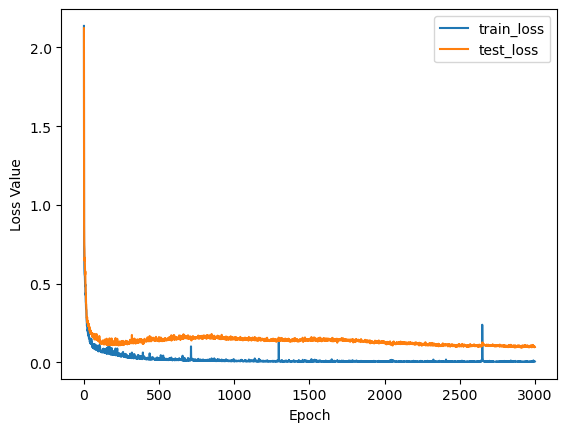

In [38]:
plt.plot(train_loss_list, label='train_loss')
plt.plot(test_loss_list, label = 'test_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
# plt.ylim([0.5, 1])
plt.legend(loc='upper right')
plt.savefig("lossvalue",dpi=1200)
plt.show()


In [43]:
predict_list = []
label_list = []
#Change the "test_dl" to "train_dl" to see the result of the training set
for (X,x_csv, y) in test_dl:
    X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

    predict_score = big_model(X,x_csv)

    # predict_score = best_model(x)
    predict_list.append(predict_score.flatten().detach().cpu().numpy().flatten())
    label_list.append(y.flatten().detach().cpu().numpy())

predict_array = np.hstack(predict_list)
label_array = np.hstack(label_list)
#predict_array[:5],label_array[:5]

data_to_write2 = np.column_stack((predict_array, label_array))

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])


In [44]:
r2_score(label_array, predict_array)

0.8658179227812963

In [45]:
mean_absolute_error(label_array, predict_array)

0.16209877

In [46]:
mean_squared_error(label_array, predict_array)

0.08982356

In [47]:
import csv

In [48]:
data_to_write2 = np.column_stack((predict_array, label_array, csv_files_test))#Change this line to decide which information you want to write in the CSV file
csv_filename = "predictions_and_labels_train.csv"
with open(csv_filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
   
    # Write title line
    writer.writerow(['Prediction', 'Label','csvfile'])
    
    # Write data to CSV file
    for row in data_to_write2:
        writer.writerow(row)